# **< Analysis of Food Waste's Exhaust Quantity in Seoul and Regression Model  >**

upload : https://www.kaggle.com/code/yuseungmi/food-waste-s-exhaust-quantity-regression

# **Analysis of public data**

## **1. Publicly available data**

* **Food waste emission by local governments (2019-2021)** : <br>
https://www.bigdata-environment.kr/user/data_market/detail.do?id=df1449b0-38bb-11ea-be28-4fa0eb812a46 <br>
* **Statistics of Seoul City Resident Registration Population (District)** : https://data.seoul.go.kr/dataList/419/S/2/datasetView.do <br>
* **Seoul Food Sanitation Industry Status (District)** : https://data.seoul.go.kr/dataList/33/S/2/datasetView.do

## **2. Explain the details of your data**

**< "Food waste emission by local governments (2019-2021)" Cloumns  >**
* exhst_yy : Year of discharge
* exhst_mt : Month of Discharge
* exhst_de : Day of Discharge
* exhst_dotw : Day of the Week of Discharge
* locgov_trtry_cd : Local Area Code
* ctpr_nm : City and province name
* signgu_nm	: Name of city, county and district
* apt_cd : Apartment Code
* apt_nm : Apartment Name 
* exhst_qy : Exhaust Quantity
* exhst_qy_rt : Exhaust Quantity Rate
* exhst_co : Number of times food waste is discharged
* exhst_co_rt : exhst_co Rate
* exhst_qy_avg : Monthly City or District Average Exhaust Quantity
* exhst_co_avg : Monthly City or District Average exhst_co

## **3. Loading Dataset & Data Observation**

In [741]:
import pandas as pd
df_Initial = pd.read_csv('지자체별음식물쓰레기배출내역(2023년).csv')

In [742]:
print(df_Initial.head())
print(df_Initial.shape)
print(df_Initial.info())

   exhst_yy  exhst_mt  exhst_de  exhst_dotw locgov_trtry_cd ctpr_nm signgu_nm  \
0      2019        11         1           6             W01   서울특별시       종로구   
1      2019        11         2           7             W01   서울특별시       종로구   
2      2019        11         3           1             W01   서울특별시       종로구   
3      2019        11         4           2             W01   서울특별시       종로구   
4      2019        11         5           3             W01   서울특별시       종로구   

   apt_cd  apt_nm  exhst_qy  exhst_qy_rt  exhst_co  exhst_co_rt  exhst_qy_avg  \
0     NaN     NaN   3087800         2.87      2462         3.45       3789207   
1     NaN     NaN   3126100         2.91      2286         3.20       3789207   
2     NaN     NaN   3889050         3.62      2712         3.80       3789207   
3     NaN     NaN   3826850         3.56      2732         3.83       3789207   
4     NaN     NaN   3460950         3.22      2505         3.51       3789207   

   exhst_co_avg  
0       

In [743]:
df_Initial.describe()

,exhst_yy,exhst_mt,exhst_de,exhst_dotw,apt_cd,apt_nm,exhst_qy,exhst_qy_rt,exhst_co,exhst_co_rt,exhst_qy_avg,exhst_co_avg
count,87779.000000,87779.000000,87779.000000,87779.000000,0.0,0.0,8.777900e+04,87779.000000,87779.000000,87779.000000,8.777900e+04,87779.000000
mean,2020.209788,6.266328,15.745611,4.008829,NaN,NaN,1.558863e+07,3.304917,8830.798129,3.304880,1.558863e+07,8830.809533
std,0.600395,3.577319,8.801277,2.001777,NaN,NaN,1.902726e+07,0.979624,10094.717940,0.767943,1.834934e+07,9975.838716
min,2019.000000,1.000000,1.000000,1.000000,NaN,NaN,2.000000e+02,0.010000,1.000000,0.030000,2.113000e+03,1.000000
25%,2020.000000,3.000000,8.000000,2.000000,NaN,NaN,3.211725e+06,2.960000,1764.000000,3.070000,3.354385e+06,1801.000000
50%,2020.000000,6.000000,16.000000,4.000000,NaN,NaN,1.019780e+07,3.200000,5848.000000,3.250000,1.028989e+07,5992.000000
75%,2021.000000,9.000000,23.000000,6.000000,NaN,NaN,2.152056e+07,3.530000,12805.000000,3.460000,2.152967e+07,12765.000000
max,2021.000000,12.000000,31.000000,7.000000,NaN,NaN,2.974924e+08,100.000000,106559.000000,100.000000,1.359418e+08,85642.000000


In [745]:
import plotly.express as px

fig = px.sunburst(df_Initial, path=['ctpr_nm', 'signgu_nm'], title="Local governments by city and province")
fig.update_layout(width=800, height=800)
fig.show()

## **4. EDA (with data pre-processing)**

**< Remove unnecessary cloumns >**

In [225]:
import plotly.express as px

nan_apt_cd = df_Initial['apt_cd'].isnull().mean() * 100
nan_apt_nm = df_Initial['apt_nm'].isnull().mean() * 100

fig = px.bar(x=['apt_cd', 'apt_nm'], y=[nan_apt_cd, nan_apt_nm],
             labels={'x': 'Columns', 'y': 'Percentage'},
             title='NaN Values Percentage in Columns')

fig.update_layout(width=500, height=400)
fig.show()

In [226]:
df_Initial.drop(columns=['apt_cd','apt_nm'], inplace=True)
df_Initial.drop(columns=['locgov_trtry_cd','exhst_qy_rt','exhst_co_rt', 'exhst_qy_avg', 'exhst_co_avg'], inplace=True)

**< Process duplicate and null values >**

In [227]:
df_Initial.duplicated().sum()

0

*&rarr; duplicate values : not exist*  

In [228]:
df_Initial.isnull().sum()

exhst_yy      0
exhst_mt      0
exhst_de      0
exhst_dotw    0
ctpr_nm       0
signgu_nm     0
exhst_qy      0
exhst_co      0
dtype: int64

*→ null values : not exist*

### **(1) Analysis of Food Waste's Exhaust Quantity by City and Province**

#### **Total amount by city and province**

In [229]:
import plotly.express as px

# Total amount by city
df_grouped = df_Initial.groupby('ctpr_nm')['exhst_qy'].sum().reset_index()

# Calculate the percentage
df_grouped['percentage'] = (df_grouped['exhst_qy'] / df_grouped['exhst_qy'].sum()) * 100

fig = px.bar(df_grouped, x='ctpr_nm', y='exhst_qy', color='ctpr_nm',
             labels={'exhst_qy': 'Total Exhaust Quantity', 'ctpr_nm': 'City and Province'},
             title='Total amount by city and province',
             text='percentage',  # Add percentage values to the chart
             height=500)

fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(width=800, height=500)
fig.show()

#### **Total amount by month and year**

In [230]:
df_grouped = df_Initial.groupby(['exhst_yy', 'exhst_mt'])['exhst_qy'].sum().reset_index()

fig = px.bar(df_grouped, x='exhst_mt', y='exhst_qy', color='exhst_yy',
             labels={'exhst_qy': 'Total Exhaust Quantity', 'exhst_mt': 'Month', 'exhst_yy': 'Year'},
             title='Total amount by month and year',
             color_continuous_scale='Plasma',
             height=500)

fig.update_layout(width=800, xaxis=dict(tickmode='linear'))
fig.show()

**Checking the imbalance of data by year** <br>
* 2019: November and December data present
* 2020: All Months of Data Existence
* 2021: Data Exists from January to July

**&rarr; Select data for 2020 only**

In [231]:
df_Initial = df_Initial.drop(df_Initial[(df_Initial['exhst_yy'] == 2021) | (df_Initial['exhst_yy'] == 2019)].index)

In [232]:
unique_year_month = df_Initial[['exhst_yy', 'exhst_mt']].drop_duplicates()
print(unique_year_month)

     exhst_yy  exhst_mt
61       2020         1
92       2020         2
121      2020         3
152      2020         4
182      2020         5
213      2020         6
243      2020         7
274      2020         8
305      2020         9
335      2020        10
366      2020        11
396      2020        12


#### **Percentage of food waste by city and province (2020)**

In [233]:
import plotly.express as px

df_grouped = df_Initial.groupby('ctpr_nm')['exhst_qy'].sum().reset_index()

fig = px.pie(df_grouped, names='ctpr_nm', values='exhst_qy',
             labels={'exhst_qy': 'Total Exhaust Quantity', 'ctpr_nm': 'city and province'},
             title='Percentage of food waste by city and province (2020)')

fig.update_traces(pull=[0,0,0,0,0,0,0,0,0.2,0,0,0,0,0,0])
fig.update_layout(width=800, height=500)
fig.show()

**&rarr; We will proceed with Seoul data**

In [234]:
df_Initial = df_Initial[df_Initial['ctpr_nm'] == '서울특별시']

### **(2) Analysis of Food Waste's Exhaust Quantity in Seoul**

#### **Exhaust Quantity by administrative districts in Seoul**

In [235]:
import requests
import json
import pandas as pd
import numpy as np
import os
import webbrowser
import folium
from folium import plugins

In [236]:
m = folium.Map(location=[36, 127], tiles="OpenStreetMap", zoom_start=8)
geo_data = json.load(open('seoul_municipalities_geo_simple.json', encoding='utf-8'))

dff = pd.read_csv('지자체별음식물쓰레기배출내역(2023년).csv', encoding='utf-8', dtype={'code':'str'})

folium.Choropleth(geo_data=geo_data,
                  data = dff,
                  columns=['signgu_nm', 'exhst_qy'],
                  key_on='feature.properties.name',
                  fill_color='YlOrBr',
                  fill_opacity=0.8
                  ).add_to(m)

m.save('folium_kr.html')
webbrowser.open_new("folium_kr.html")

True

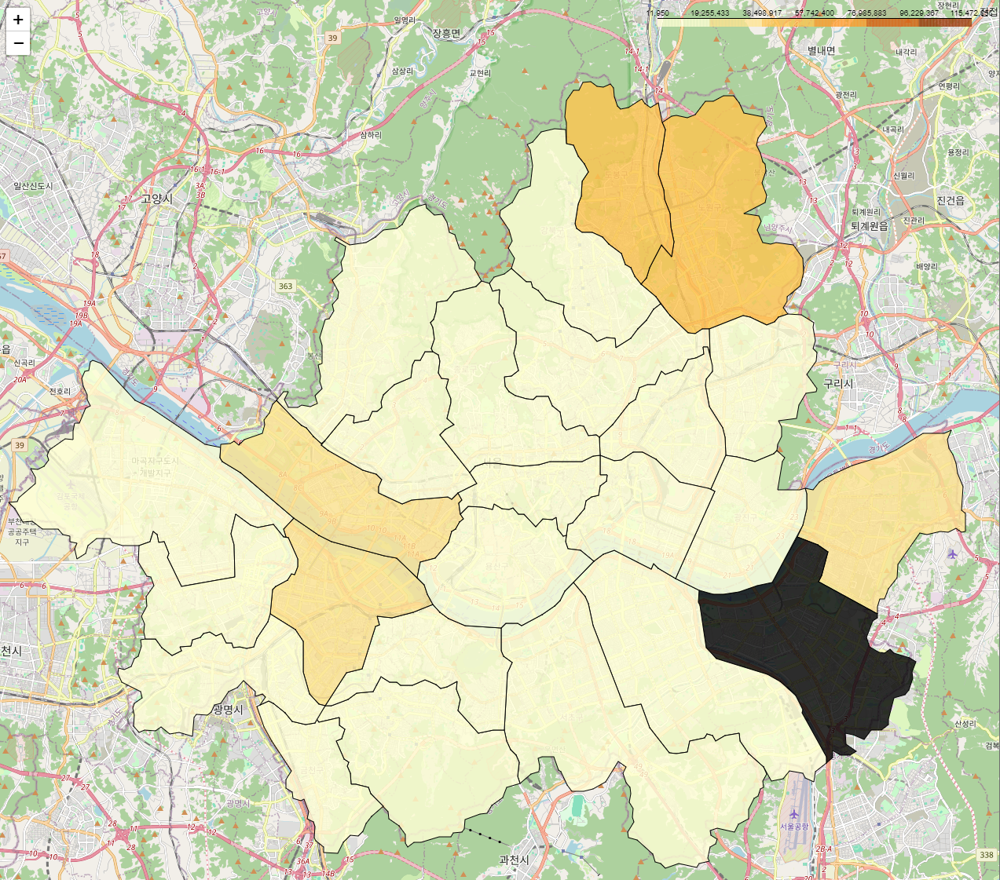

In [237]:
from IPython.display import display, Image

image_paths = ['seoul.png']
width = 500

for image_path in image_paths:
    display(Image(filename=image_path, width=width))

&rarr; It can be seen that there is no data on "Songpa-gu"

#### **Monthly Food Waste's Exhaust Quantity in Seoul (2020)**

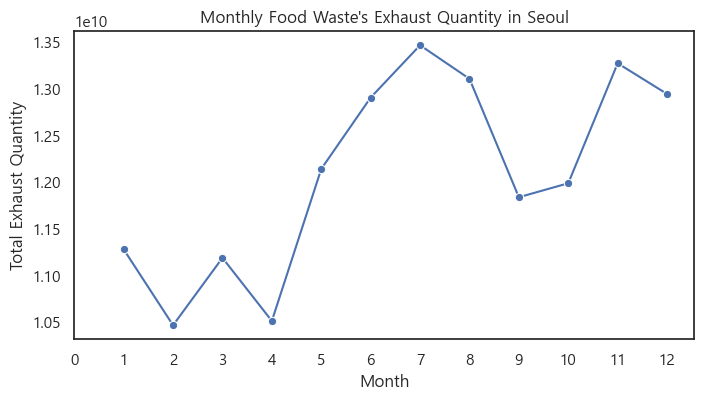

In [238]:
import matplotlib.pyplot as plt
import seaborn as sns

df_grouped = df_Initial.groupby('exhst_mt')['exhst_qy'].sum().reset_index()

# 그래프 그리기
plt.figure(figsize=(8, 4))
sns.lineplot(x='exhst_mt', y='exhst_qy', data=df_grouped, marker='o')
plt.title("Monthly Food Waste's Exhaust Quantity in Seoul")
plt.xlabel('Month')
plt.xticks(np.arange(0,13))
plt.ylabel('Total Exhaust Quantity')
plt.show()

#### **Monthly amount of administrative district food waste" (Seoul)**

In [239]:
df_grouped = df_Initial.groupby(['signgu_nm', 'exhst_mt'])['exhst_qy'].sum().reset_index()

fig = px.bar(df_grouped, x='signgu_nm', y='exhst_qy', color='signgu_nm',
             labels={'exhst_qy': 'Exhaust Quantity', 'signgu_nm': 'local government'},
             title='Monthly amount of administrative district food waste (Seoul)',
             facet_col='exhst_mt', facet_col_wrap=3)

fig.update_layout(width=1000, height=800)
fig.show()

#### **The amount of food waste in the administrative district by day of the week**

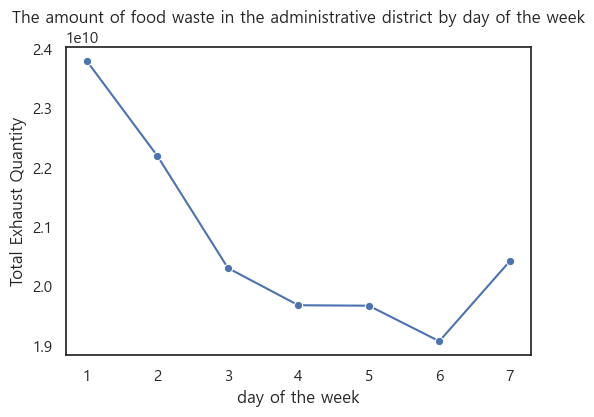

In [240]:
#  1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 5: 'Thursday', 6: 'Friday', 7: 'Saturday'

df_grouped = df_Initial.groupby('exhst_dotw')['exhst_qy'].sum().reset_index()

plt.figure(figsize=(6, 4))
sns.lineplot(x='exhst_dotw', y='exhst_qy', data=df_grouped, marker='o')

plt.title("The amount of food waste in the administrative district by day of the week")
plt.xlabel('day of the week')
plt.ylabel('Total Exhaust Quantity')
plt.show()

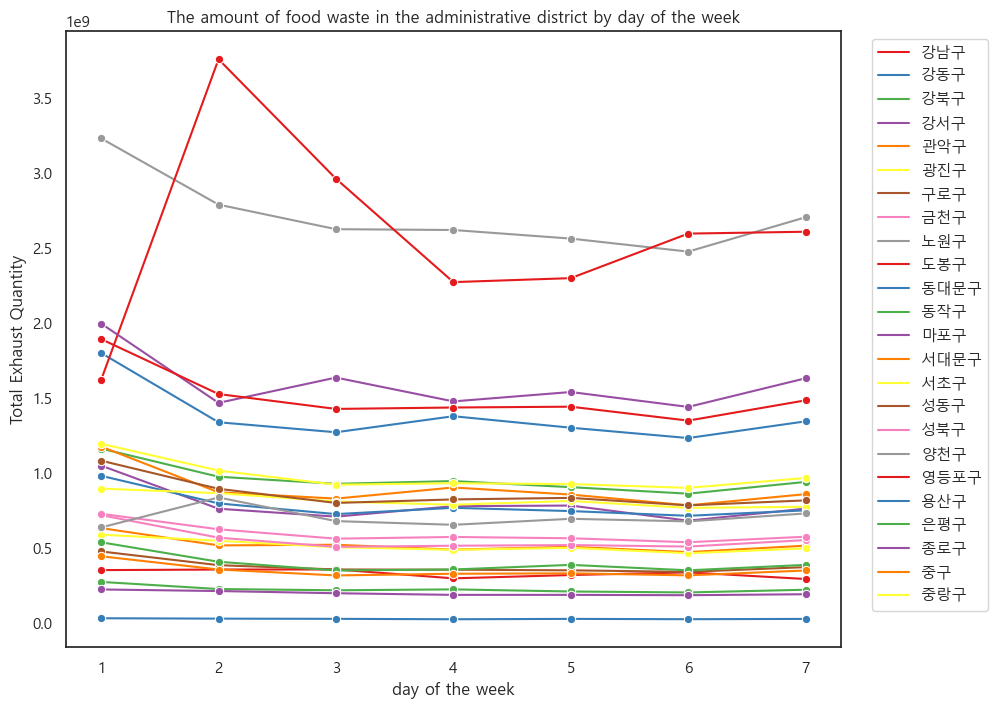

In [241]:
#  1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 5: 'Thursday', 6: 'Friday', 7: 'Saturday'

plt.rc("font", family = "Malgun Gothic")
sns.set(font="Malgun Gothic", 
rc={"axes.unicode_minus":False}, style='white')

df_grouped = df_Initial.groupby(['signgu_nm', 'exhst_dotw'])['exhst_qy'].sum().reset_index()

plt.figure(figsize=(10, 8))
sns.lineplot(x='exhst_dotw', y='exhst_qy', hue = 'signgu_nm', data=df_grouped, marker='o', palette='Set1')

plt.title("The amount of food waste in the administrative district by day of the week")
plt.xlabel('day of the week')
plt.ylabel('Total Exhaust Quantity')
plt.legend( loc='upper right', bbox_to_anchor=(1.2, 1))

plt.show()

### **(3)Adding data**

##### **(3)-1 Population data by administrative district**

In [243]:
population_df = pd.read_csv('주민등록인구_20231210054512.csv')

In [244]:
population_df.iloc[:, 0:14].head()

# administrative district : population_df.iloc[:, 1] 
# Q1 2020 (January to March) : population_df.iloc[:, 2:14]  
# Q2 2020 (April to June) : population_df.iloc[:, 14:26] 
# Q3 2020 (July to September) : population_df.iloc[:, 26:38] 
# Q4 2020 (October to December) : population_df.iloc[:, 38:50]

,동별(1),동별(2),2020 1/4,2020 1/4.1,2020 1/4.2,2020 1/4.3,2020 1/4.4,2020 1/4.5,2020 1/4.6,2020 1/4.7,2020 1/4.8,2020 1/4.9,2020 1/4.10,2020 1/4.11
0,동별(1),동별(2),세대 (세대),계 (명),계 (명),계 (명),한국인 (명),한국인 (명),한국인 (명),등록외국인 (명),등록외국인 (명),등록외국인 (명),세대당인구 (명),65세이상고령자 (명)
1,동별(1),동별(2),소계,소계,남자,여자,소계,남자,여자,소계,남자,여자,소계,소계
2,합계,소계,4354006,10013781,4874995,5138786,9733655,4742217,4991438,280126,132778,147348,2.24,1518239
3,합계,종로구,74151,161984,78271,83713,151217,73704,77513,10767,4567,6200,2.04,28073
4,합계,중구,63045,136469,66769,69700,126175,61839,64336,10294,4930,5364,2,23794


**Data exist in the above form by dividing 2020 into four quarters. <br>
The above is the first quarter data.**

---------------

Data on household, men, women, registered foreigners, and those aged 65 or older will be used.

In [245]:
q1 = population_df.iloc[:, [1,2,4,5,9,13]]
q2 = population_df.iloc[:, [1,14,16,17,21,25]]
q3 = population_df.iloc[:, [1,26,28,29,33,37]]
q4 = population_df.iloc[:, [1,38,40,41,45,49]]

In [246]:
for dataframe in [q1, q2, q3, q4]:
    dataframe.columns.values[0] = 'signgu_nm'
    dataframe.columns.values[1] = 'household'
    dataframe.columns.values[2] = 'male'
    dataframe.columns.values[3] = 'female'
    dataframe.columns.values[4] = 'foreign'
    dataframe.columns.values[5] = 'older'

In [247]:
q1 = q1.drop([0,1,2]).reset_index(drop=True)
q2 = q2.drop([0,1,2]).reset_index(drop=True)
q3 = q3.drop([0,1,2]).reset_index(drop=True)
q4 = q4.drop([0,1,2]).reset_index(drop=True)

In [248]:
print(q1.head(4),"\n")
print(q2.head(4),"\n")
print(q3.head(4),"\n")
print(q4.head(4))

  signgu_nm household    male  female foreign  older
0       종로구     74151   78271   83713   10767  28073
1        중구     63045   66769   69700   10294  23794
2       용산구    110895  119961  126204   16586  39439
3       성동구    135643  149891  157302    8151  44728 

  signgu_nm household    male  female foreign  older
0       종로구     74497   77745   82775   10137  28203
1        중구     63354   66545   69485    9938  24035
2       용산구    111586  119494  125868   15931  39650
3       성동구    135937  148554  156297    7454  45005 

  signgu_nm household    male  female foreign  older
0       종로구     74861   77391   82451    9890  28396
1        중구     63594   66193   69128    9521  24265
2       용산구    112451  119074  125879   15167  39995
3       성동구    136096  147582  155113    7104  45372 

  signgu_nm household    male  female foreign  older
0       종로구     75003   76876   82120    9612  28507
1        중구     63686   65776   68859    9395  24495
2       용산구    113093  118835  125810   

---------------

**Quarterly Population by Administrative District**

In [249]:
quarters = ['1', '2', '3', '4']
for i, dataframe in enumerate([q1, q2, q3, q4]):
    dataframe.insert(0, 'quarter', quarters[i])
    convert = dataframe.columns.difference(['signgu_nm'])
    dataframe[convert] = dataframe[convert].astype(int)
    
q_mergerd = pd.concat([q1,q2,q3,q4], axis=0, ignore_index=True)

In [250]:
q_mergerd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   quarter    100 non-null    int32 
 1   signgu_nm  100 non-null    object
 2   household  100 non-null    int32 
 3   male       100 non-null    int32 
 4   female     100 non-null    int32 
 5   foreign    100 non-null    int32 
 6   older      100 non-null    int32 
dtypes: int32(6), object(1)
memory usage: 3.3+ KB


---------------

**Combining data**

In [251]:
df_Initial.head()

,exhst_yy,exhst_mt,exhst_de,exhst_dotw,ctpr_nm,signgu_nm,exhst_qy,exhst_co
61,2020,1,1,4,서울특별시,종로구,3324150,2124
62,2020,1,2,5,서울특별시,종로구,3548600,2306
63,2020,1,3,6,서울특별시,종로구,3151900,2109
64,2020,1,4,7,서울특별시,종로구,3246350,2115
65,2020,1,5,1,서울특별시,종로구,3879200,2462


In [252]:
selected_df = df_Initial[(df_Initial['exhst_mt'] == 1) | (df_Initial['exhst_mt'] == 2) | (df_Initial['exhst_mt'] == 3)]
df1 = pd.merge(selected_df, q1, on='signgu_nm', how='left')

In [253]:
selected_df = df_Initial[(df_Initial['exhst_mt']==4) | (df_Initial['exhst_mt']==5) | (df_Initial['exhst_mt']==6)]
df2 = pd.merge(selected_df, q2, on='signgu_nm', how='left')

In [254]:
selected_df = df_Initial[(df_Initial['exhst_mt']==7) | (df_Initial['exhst_mt']==8) | (df_Initial['exhst_mt']==9)]
df3 = pd.merge(selected_df, q3, on='signgu_nm', how='left')

In [255]:
selected_df = df_Initial[(df_Initial['exhst_mt']==10) | (df_Initial['exhst_mt']==11) | (df_Initial['exhst_mt']==12)]
df4 = pd.merge(selected_df, q4, on='signgu_nm', how='left')

In [256]:
df_merged = pd.concat([df1,df2,df3,df4], axis=0, ignore_index=True)

In [257]:
print(df_merged.head())
print(df_merged.shape)
print(df_merged.info())

   exhst_yy  exhst_mt  exhst_de  exhst_dotw ctpr_nm signgu_nm  exhst_qy  \
0      2020         1         1           4   서울특별시       종로구   3324150   
1      2020         1         2           5   서울특별시       종로구   3548600   
2      2020         1         3           6   서울특별시       종로구   3151900   
3      2020         1         4           7   서울특별시       종로구   3246350   
4      2020         1         5           1   서울특별시       종로구   3879200   

   exhst_co  quarter  household   male  female  foreign  older  
0      2124        1      74151  78271   83713    10767  28073  
1      2306        1      74151  78271   83713    10767  28073  
2      2109        1      74151  78271   83713    10767  28073  
3      2115        1      74151  78271   83713    10767  28073  
4      2462        1      74151  78271   83713    10767  28073  
(8784, 14)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype 
-

##### **(3)-2 Food Sanitation Industry Status data by administrative district**

In [258]:
Resto_df = pd.read_csv('식품위생업+현황(구별).csv')

In [259]:
Resto_df.head()

,자치구별(1),자치구별(2),2020,2020.1,2020.2,2020.3,2020.4,2020.5,2020.6,2020.7,...,2020.10,2020.11,2020.12,2020.13,2020.14,2020.15,2020.16,2020.17,2020.18,2020.19
0,자치구별(1),자치구별(2),합계,식품접객업,식품접객업,식품접객업,식품접객업,식품접객업,식품접객업,식품접객업,...,식품제조업 및 가공업,식품제조업 및 가공업,식품제조업 및 가공업,식품 운반·판매·기타업,식품 운반·판매·기타업,식품 운반·판매·기타업,식품 운반·판매·기타업,식품 운반·판매·기타업,건강기능식품 제조·수입·판매업,건강기능식품 제조·수입·판매업
1,자치구별(1),자치구별(2),소계,소계,휴게음식점,일반음식점,제과점,단란주점,유흥주점,위탁급식영업,...,식품제조가공업,즉석판매제조가공업,식품첨가물 제조업,소계,식품운반업,식품판매업,용기·포장류제조업,식품보존업,소계,건강기능식품판매업
2,합계,소계,229608,169517,37058,123138,3929,2277,1838,1277,...,1609,15013,31,10323,316,9898,74,35,27026,27026
3,합계,종로구,10823,9268,1683,7100,120,108,193,64,...,30,406,-,149,1,147,1,-,778,778
4,합계,중구,11098,9110,2289,6289,154,79,217,82,...,43,433,-,420,3,384,33,-,898,898


------------
**I will only use data related to the food service industry.**

In [260]:
rest = Resto_df[['자치구별(2)', '2020.1']]

rest.columns.values[0] = 'signgu_nm'
rest.columns.values[1] = 'total_rest'

rest = rest.drop([0,1,2]).reset_index(drop=True)
rest['total_rest'] = rest['total_rest'].astype(int)

print(rest.head())

  signgu_nm  total_rest
0       종로구        9268
1        중구        9110
2       용산구        6059
3       성동구        5062
4       광진구        5945


In [261]:
fig = px.bar(rest, x='signgu_nm', y='total_rest', color = 'signgu_nm', 
             title='Total Restaurants in Seoul Districts',
             labels={'signgu_nm': 'District', 'total_rest': 'Number of Restaurants'})
fig.update_layout(width=800, height=600)
fig.show()

-----------
**Combining data**

In [494]:
df_merged.head()

,exhst_yy,exhst_mt,exhst_de,exhst_dotw,ctpr_nm,signgu_nm,exhst_qy,exhst_co,quarter,household,male,female,foreign,older
0,2020,1,1,4,서울특별시,종로구,3324150,2124,1,74151,78271,83713,10767,28073
1,2020,1,2,5,서울특별시,종로구,3548600,2306,1,74151,78271,83713,10767,28073
2,2020,1,3,6,서울특별시,종로구,3151900,2109,1,74151,78271,83713,10767,28073
3,2020,1,4,7,서울특별시,종로구,3246350,2115,1,74151,78271,83713,10767,28073
4,2020,1,5,1,서울특별시,종로구,3879200,2462,1,74151,78271,83713,10767,28073


In [495]:
df = pd.merge(df_merged, rest, on='signgu_nm', how='left')

### **(4) Merged final data EDA**

**(4)-1 data infomation**

In [496]:
print(df.head())
print(df.shape)
print(df.info())

   exhst_yy  exhst_mt  exhst_de  exhst_dotw ctpr_nm signgu_nm  exhst_qy  \
0      2020         1         1           4   서울특별시       종로구   3324150   
1      2020         1         2           5   서울특별시       종로구   3548600   
2      2020         1         3           6   서울특별시       종로구   3151900   
3      2020         1         4           7   서울특별시       종로구   3246350   
4      2020         1         5           1   서울특별시       종로구   3879200   

   exhst_co  quarter  household   male  female  foreign  older  total_rest  
0      2124        1      74151  78271   83713    10767  28073        9268  
1      2306        1      74151  78271   83713    10767  28073        9268  
2      2109        1      74151  78271   83713    10767  28073        9268  
3      2115        1      74151  78271   83713    10767  28073        9268  
4      2462        1      74151  78271   83713    10767  28073        9268  
(8784, 15)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Da

**(4)-2 Remove unnecessary cloumns**

In [497]:
df.drop(columns=['exhst_yy','ctpr_nm','quarter'], inplace=True)

**(4)-3 Check missing values, outliers**

In [498]:
print(df.isnull().sum())

exhst_mt      0
exhst_de      0
exhst_dotw    0
signgu_nm     0
exhst_qy      0
exhst_co      0
household     0
male          0
female        0
foreign       0
older         0
total_rest    0
dtype: int64


In [499]:
(df[:] == 0).sum()

exhst_mt      0
exhst_de      0
exhst_dotw    0
signgu_nm     0
exhst_qy      0
exhst_co      0
household     0
male          0
female        0
foreign       0
older         0
total_rest    0
dtype: int64

**Combining the previously confirmed results,  <br>
it is confirmed that there is no missing value other than information that there is no data on Songpa-gu, Seoul.**

-----------------

In [500]:
import plotly.graph_objects as go
import plotly.subplots as sp

df_check = df.columns.difference(['signgu_nm'])

num_columns = len(df_check)
num_rows = (num_columns + 2) // 3

fig = sp.make_subplots(rows=num_rows, cols=3, subplot_titles=df_check)

for i, column in enumerate(df_check):
    trace = go.Box(y=df[column], name=column)
    row = (i // 3) + 1
    col = (i % 3) + 1
    fig.add_trace(trace, row=row, col=col)

fig.update_layout(height=1000, showlegend=False, title_text="Box Plots of Selected Columns")
fig.show()

In [501]:
df['foreign_log'] = np.log1p(df['foreign'])
fig = px.box(df, y='foreign_log', title='Box Plot of Log-transformed "foreign" Column')
fig.update_layout(height=400, width=600)
fig.show()

In [502]:
df['total_rest_log'] = np.log1p(df['total_rest'])
fig = px.box(df, y='total_rest_log', title='Box Plot of Log-transformed "rest_log" Column')
fig.update_layout(height=400, width=600)
fig.show()

**(4)-4 Data Encoding**

In [503]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df.signgu_nm = le.fit_transform(df.signgu_nm)

In [504]:
df.signgu_nm.unique()

array([21, 22, 19, 15,  5, 10, 23, 16,  2,  9,  8, 20, 13, 12, 17,  3,  6,
        7, 18, 11,  4, 14,  0,  1])

**(4)-5 linear relationship**

C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\100092543.py:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.

C:\Users\ysm\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



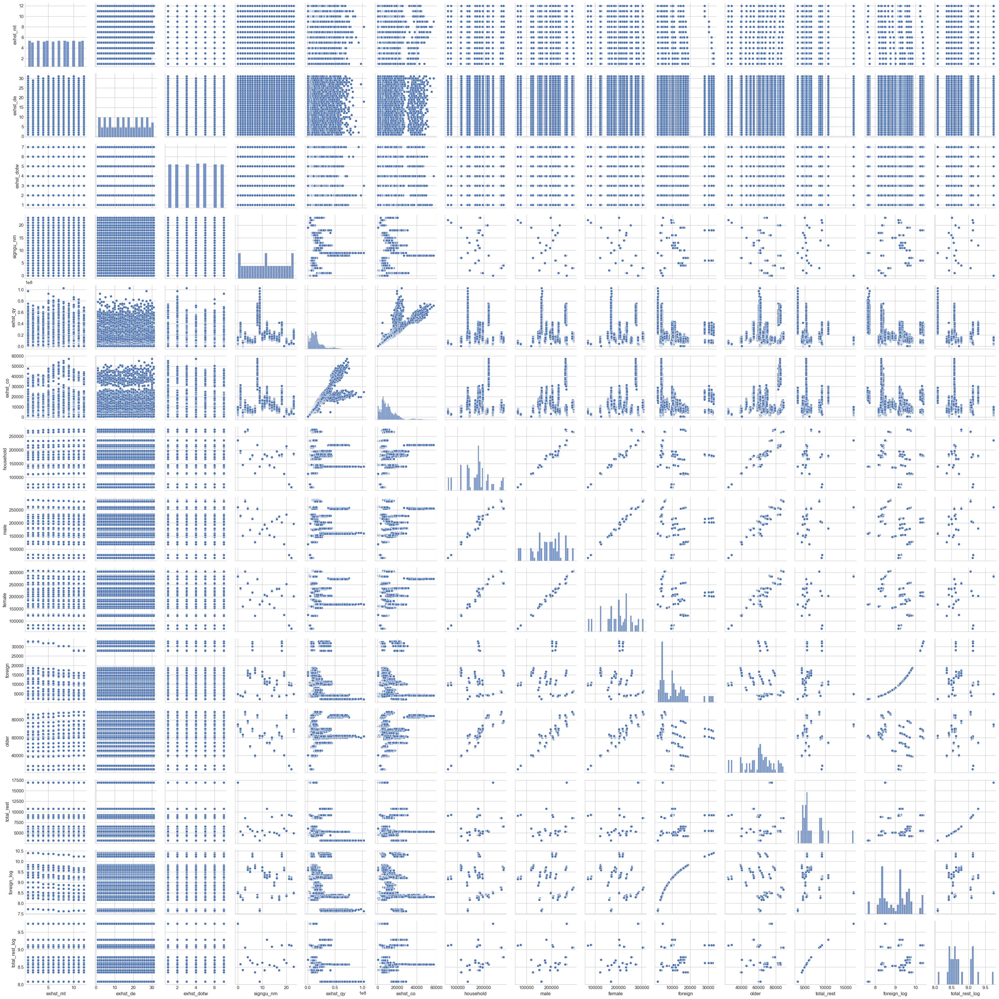

In [505]:
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import style

style.use('seaborn-whitegrid')
plt.rcParams['figure.figsize'] = (20,10)

sb.pairplot(df)

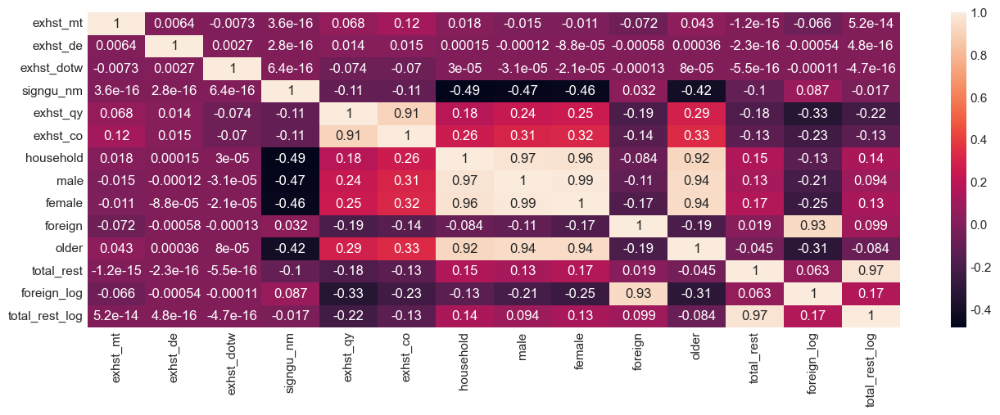

In [506]:
dfcorr = df.corr()
plt.figure(figsize=(16,5))
sns.heatmap(data = dfcorr, annot=True)
plt.show()

In [507]:
df.drop(columns=['foreign','total_rest'], inplace=True)

## **5. Apply various models on the dataset**

### **5-(1). SLR(Simple Linear Regression)**

**1. Splitting into training and testing datasets (SLR)**

In [625]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_var = df[['exhst_co']] # independent variable
y_var = df['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
	X_var, y_var, test_size = 0.3, random_state = 0)

**2. Training model (SLR)**

In [626]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)
yhat = lr.predict(X_test)

**3. Checking accuracy (SLR)**

In [627]:
from sklearn.metrics import r2_score
print(r2_score(y_test, yhat))

0.8183315442735191


**slope and intercept values from the model**

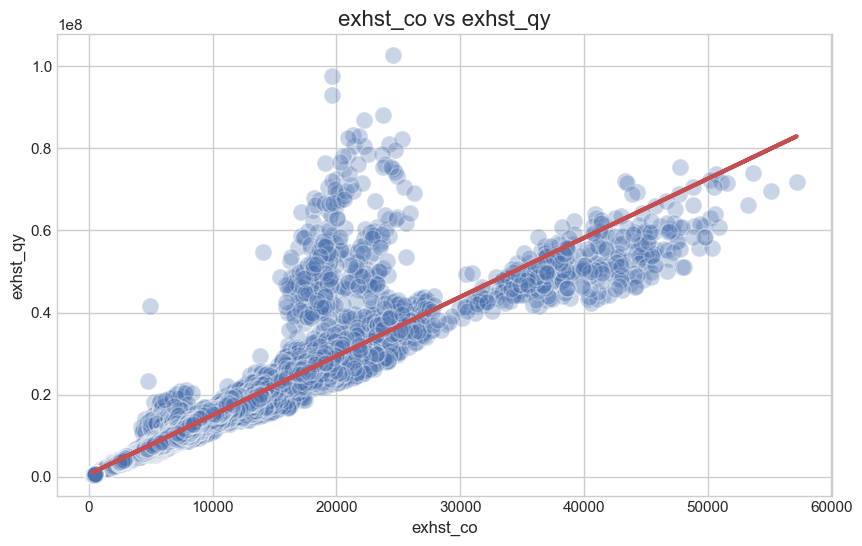

In [628]:
slr_slope = lr.coef_
slr_intercept = lr.intercept_

plt.figure(figsize=(10, 6))

sb.scatterplot(x = 'exhst_co', y = 'exhst_qy', 
		data = df, s = 150, alpha = 0.3, edgecolor = 'white')
plt.plot(df['exhst_co'], slr_slope*df['exhst_co'] + slr_intercept, 
		color = 'r', linewidth = 3)

plt.title('exhst_co vs exhst_qy', fontsize = 16)
plt.ylabel('exhst_qy', fontsize = 12)
plt.xlabel('exhst_co', fontsize = 12)
plt.show()

**4. Improving accuracy (SLR)**

Changing split ratio

In [629]:
test_sizes = [0.2, 0.3, 0.4]

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X_var, y_var, test_size = test_size, random_state = 0)

    lr = LinearRegression()
    lr.fit(X_train, y_train)
    yhat = lr.predict(X_test)
    
    print("Test Size:", test_size)
    print("R2 score:", r2_score(y_test, yhat),'\n')

Test Size: 0.2
R2 score: 0.8226216334942722 

Test Size: 0.3
R2 score: 0.8183315442735191 

Test Size: 0.4
R2 score: 0.8214666049226017 



**&rarr; Best : Test Size: 0.2, R2 score: 0.8226216334942722**

--------------------

 Feature Scaling

< MinMaxScaler >

In [630]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

df_SLR1 = df.copy()

columns_to_normalize = ['exhst_qy', 'exhst_co']
df_SLR1[columns_to_normalize] = scaler.fit_transform(df_SLR1[columns_to_normalize])

In [631]:
df_SLR1[['exhst_qy', 'exhst_co']].describe()

,exhst_qy,exhst_co
count,8784.000000,8784.000000
mean,0.158015,0.189545
std,0.131044,0.148771
min,0.000000,0.000000
25%,0.073358,0.091636
50%,0.127982,0.154492
75%,0.189518,0.245167
max,1.000000,1.000000


In [632]:
from sklearn.model_selection import train_test_split
test_sizes = [0.2, 0.3, 0.4]

X1_var = df_SLR1[['exhst_co']]  # independent variable
y_var = df_SLR1['exhst_qy'] # dependent variable

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var, y_var, test_size = test_size, random_state = 0)

    lr = LinearRegression()
    lr.fit(X_train, y_train)
    yhat = lr.predict(X_test)
    
    print("Test Size:", test_size)
    print("R2 score:", r2_score(y_test, yhat),'\n')

Test Size: 0.2
R2 score: 0.8226216334942722 

Test Size: 0.3
R2 score: 0.8183315442735191 

Test Size: 0.4
R2 score: 0.8214666049226018 



< Log Scaler >

In [633]:
import numpy as np

df_SLR2 = df.copy()

columns_to_normalize = ['exhst_qy', 'exhst_co']
df_SLR2[columns_to_normalize] = np.log1p(df_SLR2[columns_to_normalize])

In [634]:
df_SLR2[['exhst_qy', 'exhst_co']].describe()

,exhst_qy,exhst_co
count,8784.000000,8784.000000
mean,16.271655,8.987571
std,0.956615,0.922622
min,12.792055,5.529429
25%,15.877628,8.607171
50%,16.414457,9.110575
75%,16.798340,9.562018
max,18.446752,10.954362


In [635]:
from sklearn.model_selection import train_test_split
test_sizes = [0.2, 0.3, 0.4]

X1_var = df_SLR2[['exhst_co']]  # independent variable
y_var = df_SLR2['exhst_qy'] # dependent variable

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var, y_var, test_size = test_size, random_state = 0)

    lr = LinearRegression()
    lr.fit(X_train, y_train)
    yhat = lr.predict(X_test)
    
    print("Test Size:", test_size)
    print("R2 score:", r2_score(y_test, yhat),'\n')

Test Size: 0.2
R2 score: 0.9685278978704934 

Test Size: 0.3
R2 score: 0.9669145273843833 

Test Size: 0.4
R2 score: 0.9670031735605701 



**&rarr; Best : Scaler : Log Scaler, Test Size: 0.2, R2 score: 0.9685278978704934**

-------------
**Constructing a distribution plot by combining the predicted values and the actual values**

C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




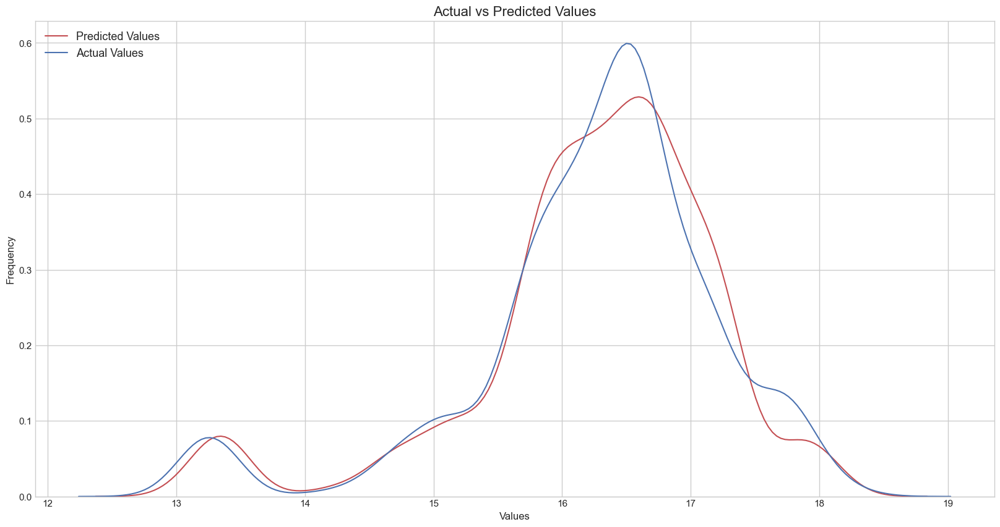

In [636]:
sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**Check out accuracy : RMSE**

In [637]:
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(y_test, yhat))
print('RMSE: {}'.format(rmse))

RMSE: 0.17813415622210874


### **5-(2). MLR (Multiple linear regression)**

In [638]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   exhst_mt        8784 non-null   int64  
 1   exhst_de        8784 non-null   int64  
 2   exhst_dotw      8784 non-null   int64  
 3   signgu_nm       8784 non-null   int32  
 4   exhst_qy        8784 non-null   int64  
 5   exhst_co        8784 non-null   int64  
 6   household       8784 non-null   int32  
 7   male            8784 non-null   int32  
 8   female          8784 non-null   int32  
 9   older           8784 non-null   int32  
 10  foreign_log     8784 non-null   float64
 11  total_rest_log  8784 non-null   float64
dtypes: float64(2), int32(5), int64(5)
memory usage: 652.1 KB


**1. Splitting into training and testing datasets (MLR)**

In [640]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X1_var = df[[
        'exhst_co',
        'household',
		'male',
		'female',
        'older',
        'foreign_log',
        'total_rest_log']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

**2. Training model and checking out accuracy (MLR)**

In [641]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)
yhat = lr.predict(X_test)

**3. Checking accuracy (MLR)**

In [642]:
from sklearn.metrics import r2_score
print(r2_score(y_test, yhat))

0.8493515866309953


**Constructing a distribution plot by combining the predicted values and the actual values**

C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




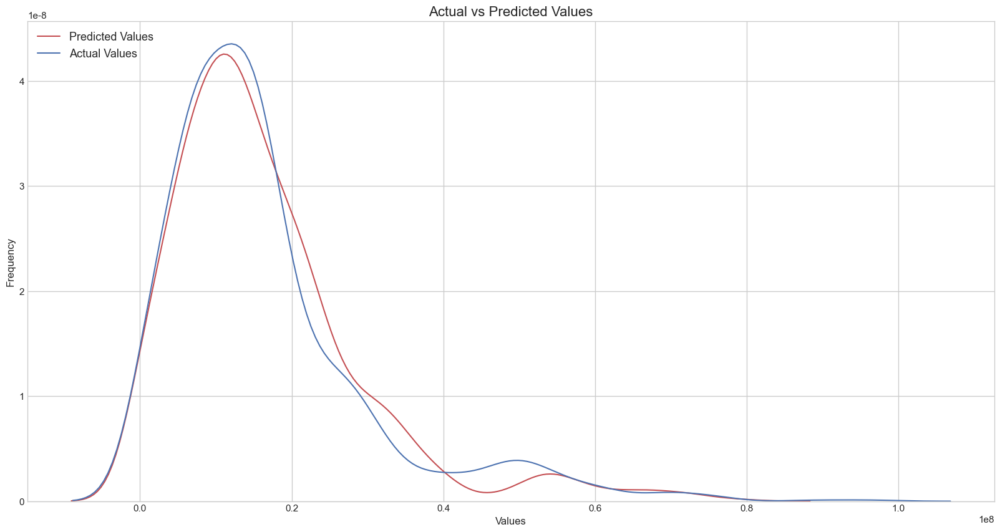

In [643]:
sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**4. Improving accuracy (MLR)**

Changing split ratio

In [644]:
test_sizes = [0.2, 0.3, 0.4]

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var_scaled, y_var, test_size = test_size, random_state = 0)

    lr = LinearRegression()
    lr.fit(X_train, y_train)
    yhat = lr.predict(X_test)
    
    print("Test Size:", test_size)
    print("R2 score:", r2_score(y_test, yhat),'\n')

Test Size: 0.2
R2 score: 0.8493515866309953 

Test Size: 0.3
R2 score: 0.8466023481846816 

Test Size: 0.4
R2 score: 0.8495642279895216 



**&rarr; Best : Test Size: 0.4, R2 score: 0.8495642279895216**

--------------------

Feature Scaling (Log Scaler)

In [653]:
import numpy as np

df_MLR1 = df.copy()

columns_to_normalize = ['exhst_co', 'household', 'male', 'female', 'older', 'exhst_qy'] 

df_MLR1[columns_to_normalize] = np.log1p(df_MLR1[columns_to_normalize])

In [654]:
df_MLR1[['exhst_qy', 'exhst_co','household', 'male', 'female', 'older', 'foreign_log', 'total_rest_log']].describe()

,exhst_qy,exhst_co,household,male,female,older,foreign_log,total_rest_log
count,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000
mean,16.271655,8.987571,11.999428,12.092286,12.144087,10.965677,9.030255,8.727933
std,0.956615,0.922622,0.340640,0.352985,0.357093,0.318477,0.691807,0.363086
min,12.792055,5.529429,11.051620,11.094026,11.139831,10.077231,7.627057,8.079928
25%,15.877628,8.607171,11.859032,11.940739,12.023308,10.866821,8.385717,8.500887
50%,16.414457,9.110575,12.088100,12.191119,12.223311,11.035857,9.199381,8.614044
75%,16.798340,9.562018,12.181088,12.329482,12.366436,11.166022,9.565494,9.060994
max,18.446752,10.954362,12.525431,12.571184,12.636458,11.396223,10.400133,9.738436


In [655]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
test_sizes = [0.2, 0.3, 0.4]

X1_var = df_MLR1[[
        'exhst_co',
        'household',
		'male',
		'female',
        'older',
        'foreign_log',
        'total_rest_log']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df_MLR1['exhst_qy'] # dependent variable

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var_scaled, y_var, test_size = test_size, random_state = 0)

    lr = LinearRegression()
    lr.fit(X_train, y_train)
    yhat = lr.predict(X_test)
    
    print("Test Size:", test_size)
    print("R2 score:", r2_score(y_test, yhat),'\n')

Test Size: 0.2
R2 score: 0.9753285273436798 

Test Size: 0.3
R2 score: 0.9741601321950464 

Test Size: 0.4
R2 score: 0.974260310909298 



**&rarr; Best : Log Scaler, Test Size: 0.2, R2 score: 0.9753285273436798**

-------------
**Constructing a distribution plot by combining the predicted values and the actual values**

C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




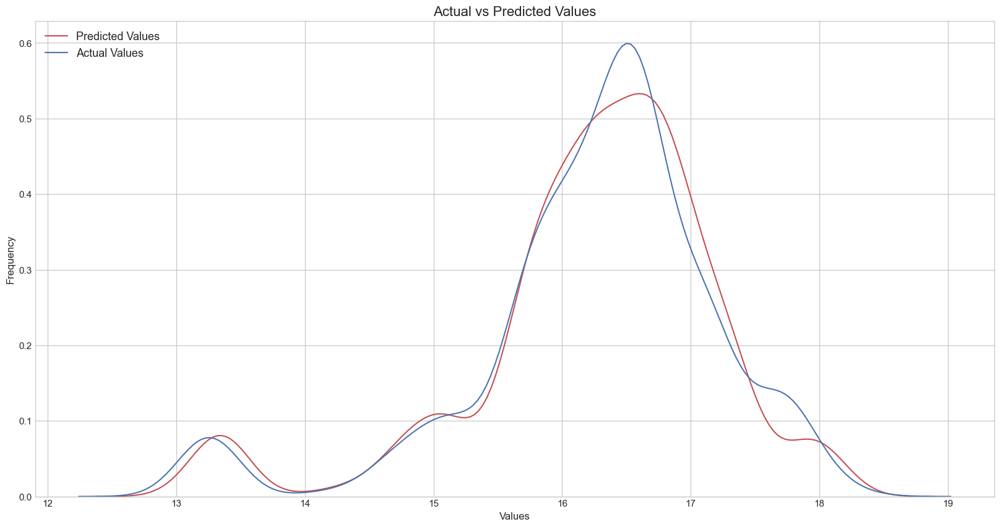

In [656]:
sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**Check out accuracy : RMSE**

In [657]:
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(y_test, yhat))
print('RMSE: {}'.format(rmse))

RMSE: 0.15733044213884168


### **5-(3). Ensemble Model : AdaBoostRegressor**

Independent variables: 'exhst_mt', 'signgu_nm', 'household', 'male','female','older','foreign_log','total_rest_log'

**1. Splitting into training and testing datasets (Ada)**

In [665]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X1_var = df[[
        'exhst_mt',
        'signgu_nm',
        'household',
		'male',
		'female',
        'older',
        'foreign_log',
        'total_rest_log']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

**2. Training model and checking out accuracy (Ada)**

In [666]:
from sklearn.ensemble import AdaBoostRegressor

ada = AdaBoostRegressor(n_estimators = 10)
ada.fit(X_train, y_train)
yhat = ada.predict(X_test)

**3. Checking accuracy (Ada)**

In [667]:
from sklearn.metrics import r2_score
print(r2_score(y_test, yhat))

0.7233024059763646


**Constructing a distribution plot by combining the predicted values and the actual values**

C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




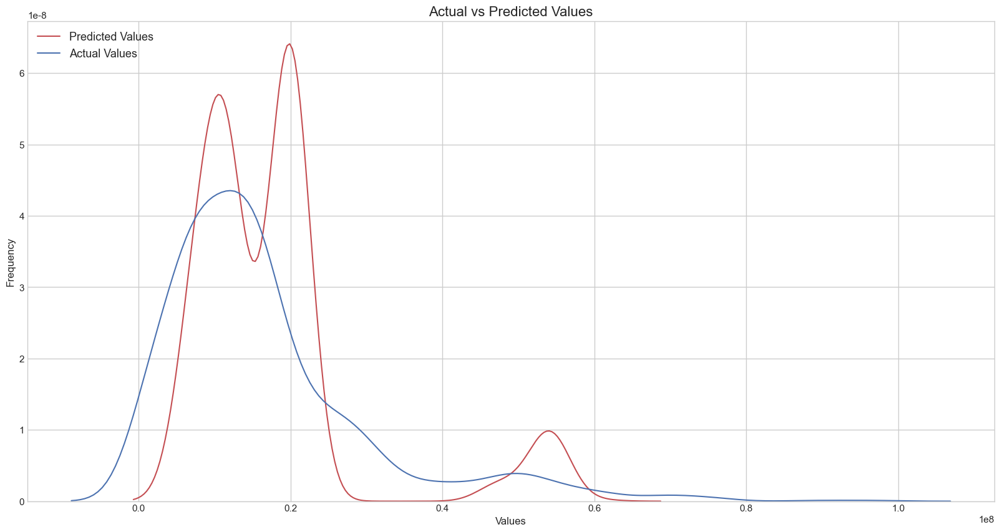

In [668]:
sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**4. Improving accuracy (Ada)**

4-(1) Tuning n parameter


최대 r2 score:  0.7530047104505324 n = 2


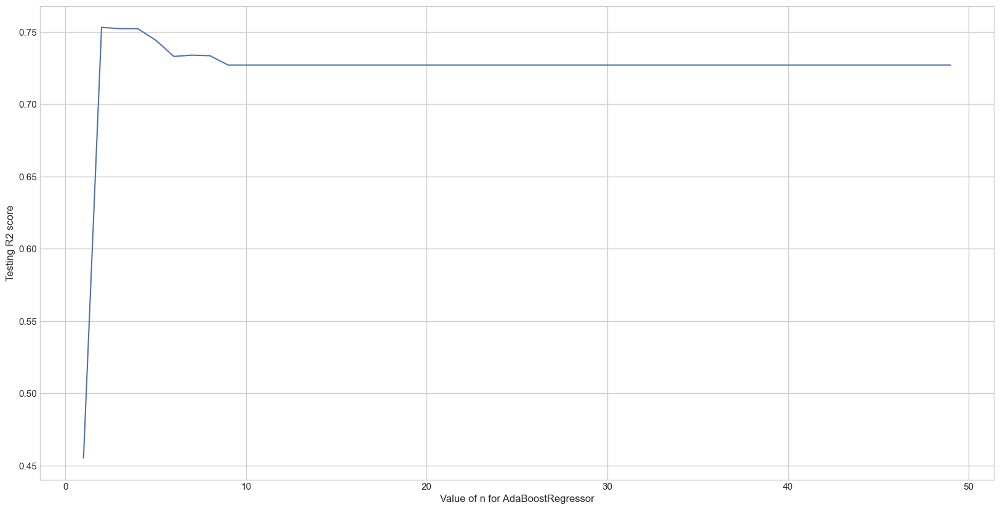

In [669]:
scaler = StandardScaler()

X1_var = df[[
        'exhst_mt',
        'signgu_nm',
        'household',
		'male',
		'female',
        'older',
        'foreign_log',
        'total_rest_log']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

n_range = range(1, 50)
accuracy_scores = []

for n in n_range:
	ada = AdaBoostRegressor(random_state=0, n_estimators = n)
	ada.fit(X_train, y_train)
	yhat = ada.predict(X_test)
	accuracy_scores.append(r2_score(y_test, yhat))

max_accuracy = max(accuracy_scores)
max_n = n_range[accuracy_scores.index(max_accuracy)]

print("\nMaximum r2 score: ",max_accuracy,"n =", max_n)

import matplotlib.pyplot as plt

plt.plot(n_range, accuracy_scores)
plt.xlabel('Value of n for AdaBoostRegressor')
plt.ylabel('Testing R2 score')
plt.show()

4-(2) Changing split ratio

Test Size: 0.2
최대 r2 score:  0.7530047104505324 n = 2 

Test Size: 0.3
최대 r2 score:  0.7334277456505709 n = 5 

Test Size: 0.4
최대 r2 score:  0.7038453571948653 n = 10 



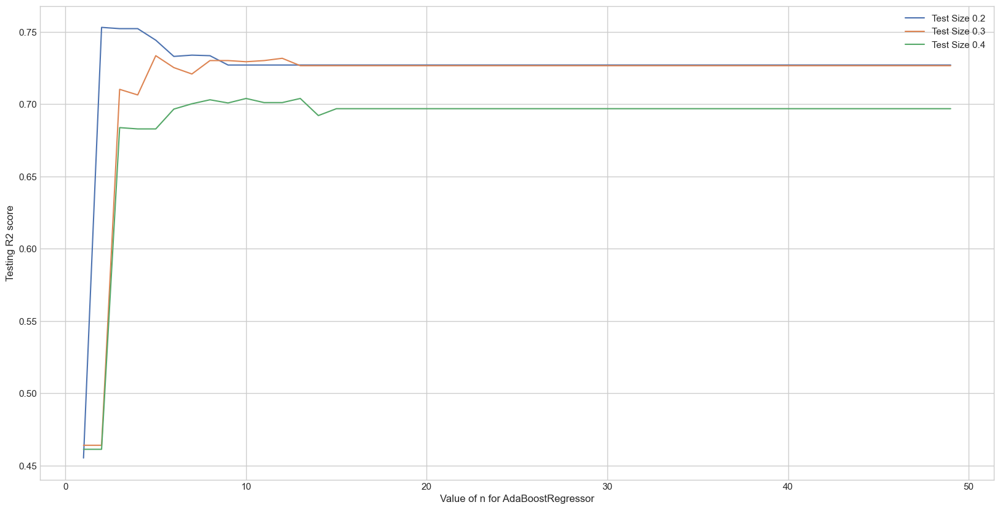

In [670]:
test_sizes = [0.2, 0.3, 0.4]

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var_scaled, y_var, test_size = test_size, random_state = 0)

    n_range = range(1, 50)
    accuracy_scores = []

    for n in n_range:
    	ada = AdaBoostRegressor(random_state=0, n_estimators = n)
    	ada.fit(X_train, y_train)
    	yhat = ada.predict(X_test)
    	accuracy_scores.append(r2_score(y_test, yhat))

    max_accuracy = max(accuracy_scores)
    max_n = n_range[accuracy_scores.index(max_accuracy)]
    
    print("Test Size:", test_size)
    print("Maximum r2 score: ",max_accuracy,"n =", max_n,"\n")

    plt.plot(n_range, accuracy_scores, label=f'Test Size {test_size}')

plt.xlabel('Value of n for AdaBoostRegressor')
plt.ylabel('Testing R2 score')
plt.legend()
plt.show()

R2 score when TestSize=0.2, n=2 : 0.7530047104505324


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\300828829.py:13: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\300828829.py:14: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




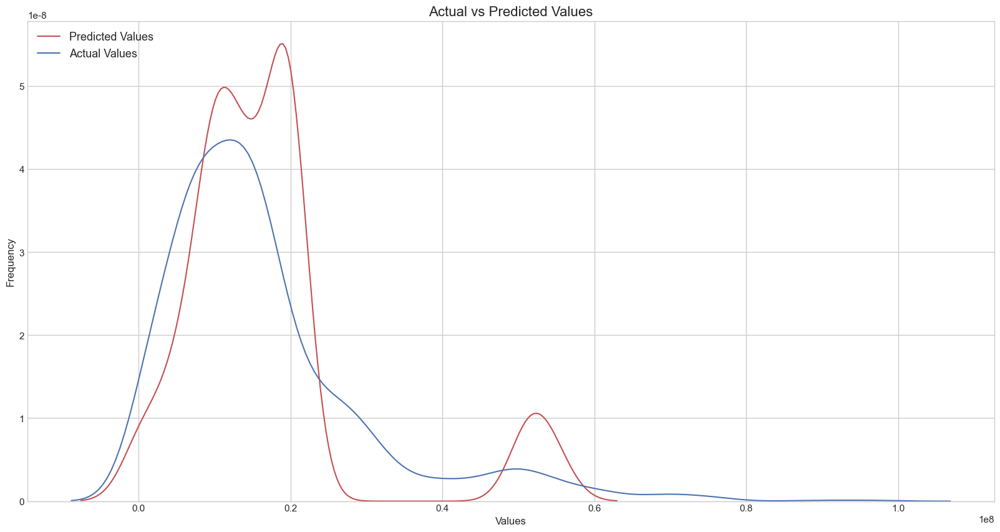

In [673]:
X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

ada = AdaBoostRegressor(random_state = 0, n_estimators = 2)
ada.fit(X_train, y_train)
yhat = ada.predict(X_test)

print("R2 score when TestSize=0.2, n=2 :",r2_score(y_test, yhat))

sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

4-(3) Feature Scaling (Log Scaler)

In [676]:
df.describe()

,exhst_mt,exhst_de,exhst_dotw,signgu_nm,exhst_qy,exhst_co,household,male,female,older,foreign_log,total_rest_log
count,8784.000000,8784.000000,8784.000000,8784.000000,8.784000e+03,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000
mean,6.513661,15.756831,4.002732,11.500000,1.652149e+07,11045.793830,171244.831284,188368.873975,198644.533242,60503.659722,9.030255,8.727933
std,3.451430,8.812031,1.995325,6.922581,1.340349e+07,8472.644617,50164.831257,54856.971338,58613.788337,16302.859815,0.691807,0.363086
min,1.000000,1.000000,1.000000,0.000000,3.593500e+05,251.000000,63045.000000,65776.000000,68859.000000,23794.000000,7.627057,8.079928
25%,4.000000,8.000000,2.000000,5.750000,7.862600e+06,5469.750000,141360.250000,153389.000000,166608.000000,52418.500000,8.385717,8.500887
50%,7.000000,16.000000,4.000000,11.500000,1.344956e+07,9049.500000,177743.000000,197030.500000,203476.500000,62059.000000,9.199381,8.614044
75%,10.000000,23.000000,6.000000,17.250000,1.974360e+07,14213.500000,195064.000000,226268.750000,234786.500000,70691.500000,9.565494,9.060994
max,12.000000,31.000000,7.000000,23.000000,1.026414e+08,57202.000000,275248.000000,288134.000000,307569.000000,88984.000000,10.400133,9.738436


In [677]:
import numpy as np
df_Ada = df.copy()

columns_to_normalize = [ 'exhst_mt', 'exhst_de', 'exhst_dotw', 'signgu_nm',	'exhst_qy',	'exhst_co',	'household', 'male', 'female', 'older'] 

df_Ada[columns_to_normalize] = np.log1p(df_Ada[columns_to_normalize])
df_Ada.rename(columns={'foreign_log': 'foreign', 'total_rest_log': 'total_rest'}, inplace=True)

In [678]:
df_Ada.describe()

,exhst_mt,exhst_de,exhst_dotw,signgu_nm,exhst_qy,exhst_co,household,male,female,older,foreign,total_rest
count,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000
mean,1.881358,2.617303,1.515958,2.282697,16.271655,8.987571,11.999428,12.092286,12.144087,10.965677,9.030255,8.727933
std,0.560678,0.716404,0.454976,0.813035,0.956615,0.922622,0.340640,0.352985,0.357093,0.318477,0.691807,0.363086
min,0.693147,0.693147,0.693147,0.000000,12.792055,5.529429,11.051620,11.094026,11.139831,10.077231,7.627057,8.079928
25%,1.609438,2.197225,1.098612,1.907372,15.877628,8.607171,11.859032,11.940739,12.023308,10.866821,8.385717,8.500887
50%,2.079442,2.833213,1.609438,2.524928,16.414457,9.110575,12.088100,12.191119,12.223311,11.035857,9.199381,8.614044
75%,2.397895,3.178054,1.945910,2.903889,16.798340,9.562018,12.181088,12.329482,12.366436,11.166022,9.565494,9.060994
max,2.564949,3.465736,2.079442,3.178054,18.446752,10.954362,12.525431,12.571184,12.636458,11.396223,10.400133,9.738436


Test Size: 0.2
최대 r2 score:  0.8755403906770624 n = 28 

Test Size: 0.3
최대 r2 score:  0.8767837803547651 n = 81 

Test Size: 0.4
최대 r2 score:  0.8749135369387945 n = 56 



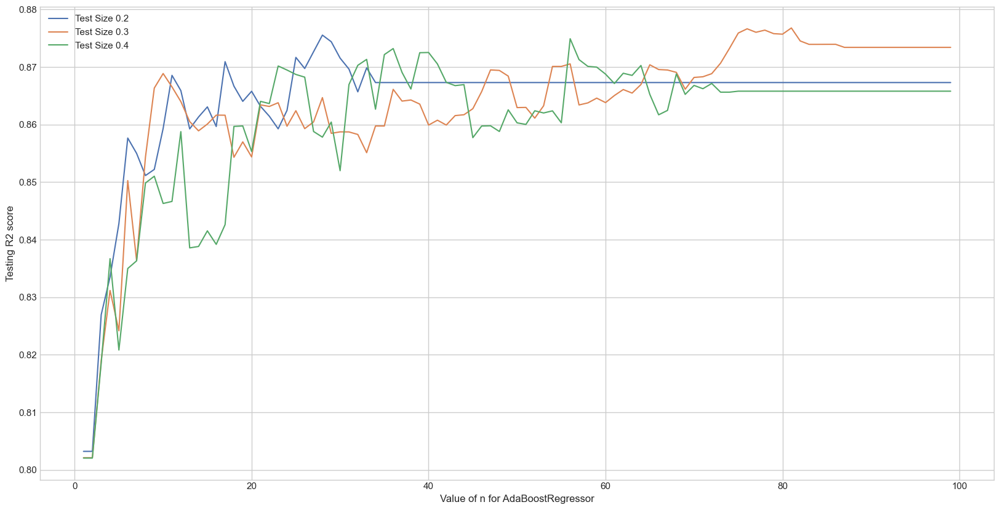

In [681]:
scaler = StandardScaler()

X1_var = df_Ada[[
        'exhst_mt',
        'signgu_nm',
        'household',
		'male',
		'female',
        'older',
        'foreign',
        'total_rest']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df_Ada['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

test_sizes = [0.2, 0.3, 0.4]

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var_scaled, y_var, test_size = test_size, random_state = 0)

    n_range = range(1, 100)
    accuracy_scores = []

    for n in n_range:
    	ada = AdaBoostRegressor(random_state=0, n_estimators = n)
    	ada.fit(X_train, y_train)
    	yhat = ada.predict(X_test)
    	accuracy_scores.append(r2_score(y_test, yhat))

    max_accuracy = max(accuracy_scores)
    max_n = n_range[accuracy_scores.index(max_accuracy)]
    
    print("Test Size:", test_size)
    print("Maximum r2 score: ",max_accuracy,"n =", max_n,"\n")

    plt.plot(n_range, accuracy_scores, label=f'Test Size {test_size}')

plt.xlabel('Value of n for AdaBoostRegressor')
plt.ylabel('Testing R2 score')
plt.legend()
plt.show()

R2 score when TestSize=0.3, n=81 : 0.8767837803547651


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\2775529523.py:13: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\2775529523.py:14: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




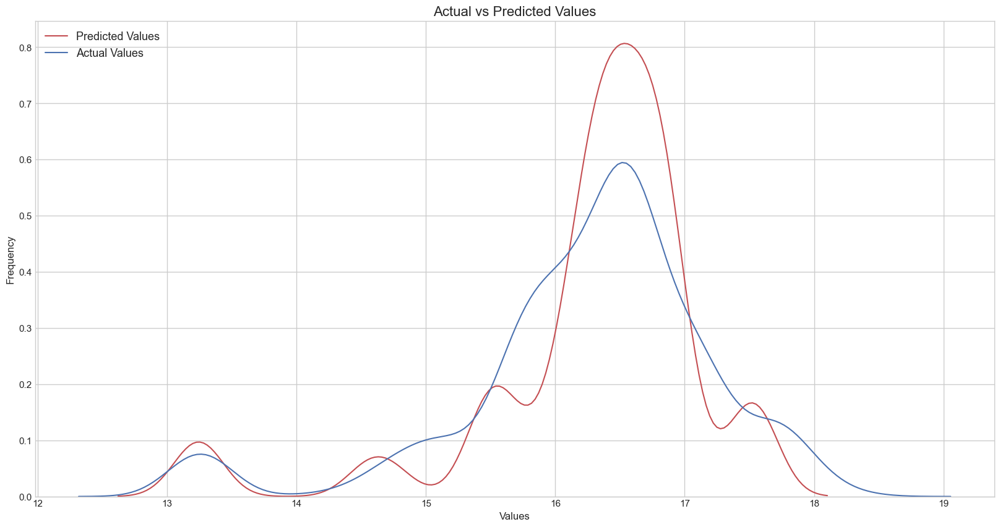

In [683]:
X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.3, 
		random_state = 0)

ada = AdaBoostRegressor(random_state = 0, n_estimators = 81)
ada.fit(X_train, y_train)
yhat = ada.predict(X_test)

print("R2 score when TestSize=0.3, n=81 :",r2_score(y_test, yhat))

sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**Check out accuracy : RMSE**

In [684]:
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(y_test, yhat))
print('RMSE: {}'.format(rmse))

RMSE: 0.34430195289749377


### **5-(4). Ensemble Model : RandomForestRegressor**

Independent variables: 'exhst_mt', 'signgu_nm', 'household', 'male','female','older','foreign_log','total_rest_log'

**1. Splitting into training and testing datasets (RF)**

In [718]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X1_var = df[[
        'exhst_mt',
        'signgu_nm',
        'household',
		'male',
		'female',
        'older',
        'foreign_log',
        'total_rest_log']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

**2. Training model and checking out accuracy (RF)**

In [719]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators = 10)
rf.fit(X_train, y_train)
yhat = rf.predict(X_test)

**3. Checking accuracy (RF)**

In [720]:
from sklearn.metrics import r2_score
print(r2_score(y_test, yhat))

0.9114182425741113


**Constructing a distribution plot by combining the predicted values and the actual values**

C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\501756899.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




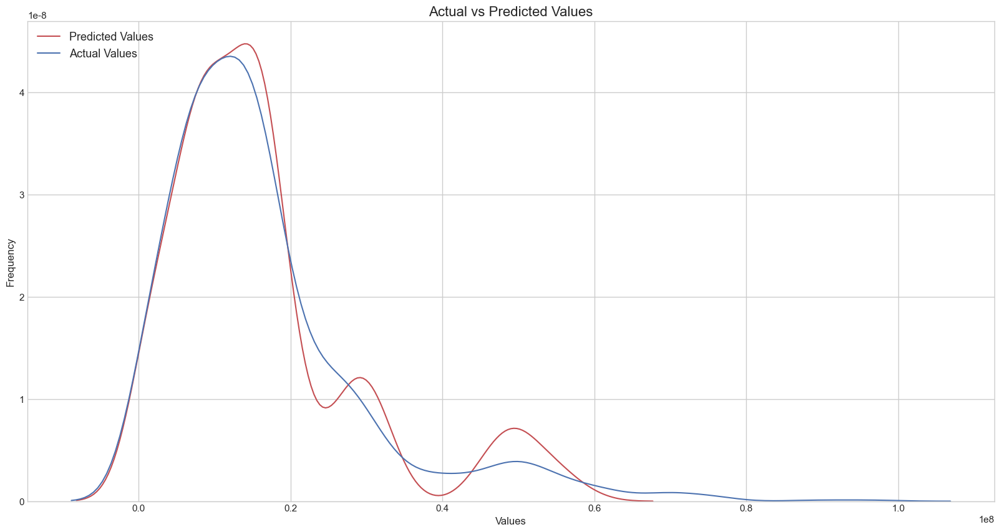

In [721]:
sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**4. Improving accuracy (RF)**

4-(1) Tuning n parameter


Maximum r2 score:  0.9121027740199653 n = 69


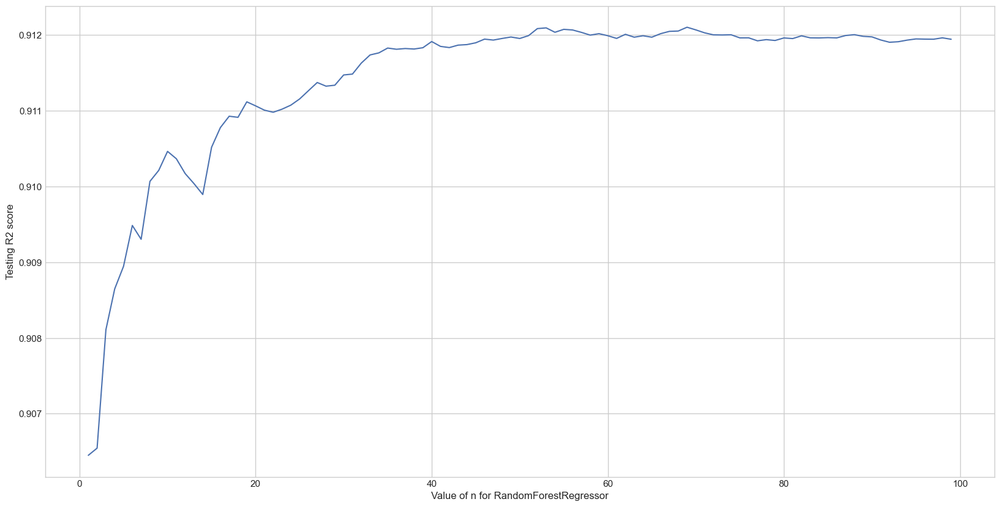

In [725]:
X1_var = df[[
        'exhst_mt',
        'signgu_nm',
        'household',
		'male',
		'female',
        'older',
        'foreign_log',
        'total_rest_log']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

n_range = range(1, 100)
accuracy_scores = []

for n in n_range:

    rf = RandomForestRegressor(random_state=0, n_estimators = n)
    rf.fit(X_train, y_train)
    yhat = rf.predict(X_test)
    accuracy_scores.append(r2_score(y_test, yhat))

max_accuracy = max(accuracy_scores)
max_n = n_range[accuracy_scores.index(max_accuracy)]

print("\nMaximum r2 score: ",max_accuracy,"n =", max_n)

import matplotlib.pyplot as plt

plt.plot(n_range, accuracy_scores)
plt.xlabel('Value of n for RandomForestRegressor')
plt.ylabel('Testing R2 score')
plt.show()

4-(2) Changing split ratio

Test Size: 0.2
Maximum r2 score:  0.9121027740199653 n = 69 

Test Size: 0.3
Maximum r2 score:  0.909622406091196 n = 59 

Test Size: 0.4
Maximum r2 score:  0.9071362351736725 n = 47 



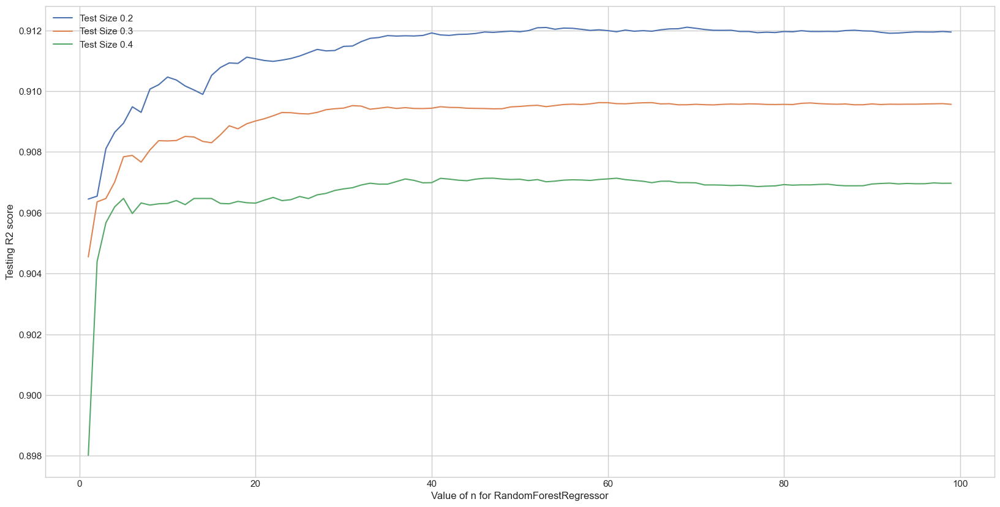

In [726]:
test_sizes = [0.2, 0.3, 0.4]

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var_scaled, y_var, test_size = test_size, random_state = 0)

    n_range = range(1, 100)
    accuracy_scores = []
    
    for n in n_range:
    
        rf = RandomForestRegressor(random_state=0, n_estimators = n)
        rf.fit(X_train, y_train)
        yhat = rf.predict(X_test)
        accuracy_scores.append(r2_score(y_test, yhat))
    
    max_accuracy = max(accuracy_scores)
    max_n = n_range[accuracy_scores.index(max_accuracy)]

    print("Test Size:", test_size)
    print("Maximum r2 score: ",max_accuracy,"n =", max_n,"\n")

    plt.plot(n_range, accuracy_scores, label=f'Test Size {test_size}')

plt.xlabel('Value of n for RandomForestRegressor')
plt.ylabel('Testing R2 score')
plt.legend()
plt.show()

R2 score when TestSize=0.2, n=69 : 0.9121027740199653


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\2325854867.py:13: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\2325854867.py:14: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




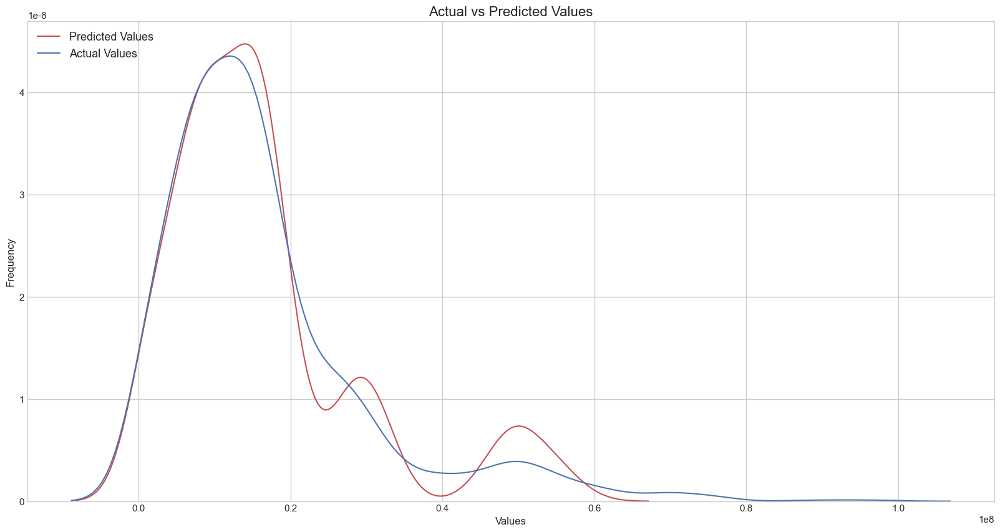

In [732]:
X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

rf = RandomForestRegressor(random_state=0, n_estimators = 69)
rf.fit(X_train, y_train)
yhat = rf.predict(X_test)

print("R2 score when TestSize=0.2, n=69 :",r2_score(y_test, yhat))

sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

4-(3) Feature Scaling (Log Scaler)

In [734]:
import numpy as np
df_RF = df.copy()

columns_to_normalize = [ 'exhst_mt', 'exhst_de', 'exhst_dotw', 'signgu_nm',	'exhst_qy',	'exhst_co',	'household', 'male', 'female', 'older'] 

df_RF[columns_to_normalize] = np.log1p(df_RF[columns_to_normalize])
df_RF.rename(columns={'foreign_log': 'foreign', 'total_rest_log': 'total_rest'}, inplace=True)

In [735]:
df_RF.describe()

,exhst_mt,exhst_de,exhst_dotw,signgu_nm,exhst_qy,exhst_co,household,male,female,older,foreign,total_rest
count,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000
mean,1.881358,2.617303,1.515958,2.282697,16.271655,8.987571,11.999428,12.092286,12.144087,10.965677,9.030255,8.727933
std,0.560678,0.716404,0.454976,0.813035,0.956615,0.922622,0.340640,0.352985,0.357093,0.318477,0.691807,0.363086
min,0.693147,0.693147,0.693147,0.000000,12.792055,5.529429,11.051620,11.094026,11.139831,10.077231,7.627057,8.079928
25%,1.609438,2.197225,1.098612,1.907372,15.877628,8.607171,11.859032,11.940739,12.023308,10.866821,8.385717,8.500887
50%,2.079442,2.833213,1.609438,2.524928,16.414457,9.110575,12.088100,12.191119,12.223311,11.035857,9.199381,8.614044
75%,2.397895,3.178054,1.945910,2.903889,16.798340,9.562018,12.181088,12.329482,12.366436,11.166022,9.565494,9.060994
max,2.564949,3.465736,2.079442,3.178054,18.446752,10.954362,12.525431,12.571184,12.636458,11.396223,10.400133,9.738436


Test Size: 0.2
Maximum r2 score:  0.9785936922605804 n = 52 

Test Size: 0.3
Maximum r2 score:  0.9768581415440223 n = 59 

Test Size: 0.4
Maximum r2 score:  0.9761199988016451 n = 60 



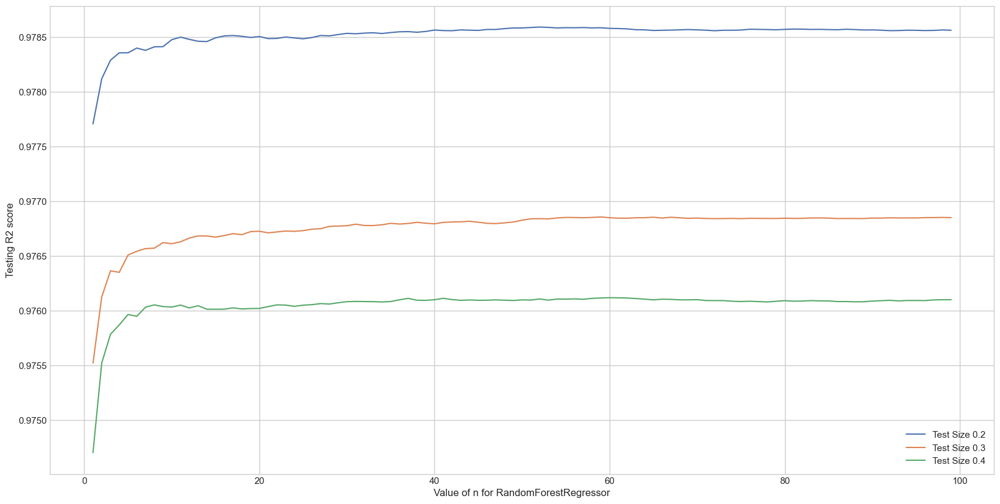

In [736]:
scaler = StandardScaler()

X1_var = df_RF[[
        'exhst_mt',
        'signgu_nm',
        'household',
		'male',
		'female',
        'older',
        'foreign',
        'total_rest']]
X1_var_scaled =  scaler.fit_transform(X1_var)
y_var = df_RF['exhst_qy'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

test_sizes = [0.2, 0.3, 0.4]

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
    	X1_var_scaled, y_var, test_size = test_size, random_state = 0)

    n_range = range(1, 100)
    accuracy_scores = []
    
    for n in n_range:
    
        rf = RandomForestRegressor(random_state=0, n_estimators = n)
        rf.fit(X_train, y_train)
        yhat = rf.predict(X_test)
        accuracy_scores.append(r2_score(y_test, yhat))
    
    max_accuracy = max(accuracy_scores)
    max_n = n_range[accuracy_scores.index(max_accuracy)]

    print("Test Size:", test_size)
    print("Maximum r2 score: ",max_accuracy,"n =", max_n,"\n")

    plt.plot(n_range, accuracy_scores, label=f'Test Size {test_size}')

plt.xlabel('Value of n for RandomForestRegressor')
plt.ylabel('Testing R2 score')
plt.legend()
plt.show()

R2 score when TestSize=0.2, n=69 : 0.9785936922605804


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\75120043.py:13: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\ysm\AppData\Local\Temp\ipykernel_1604\75120043.py:14: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




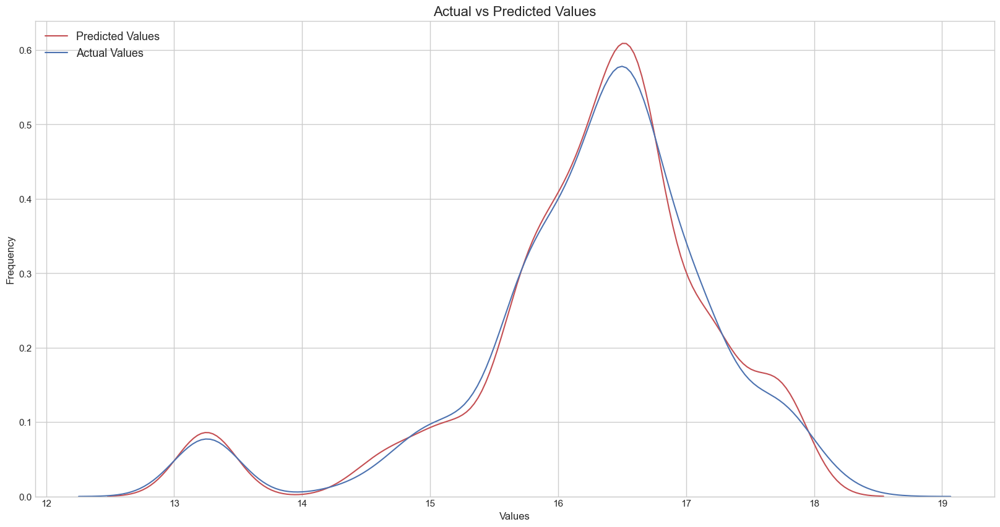

In [737]:
X_train, X_test, y_train, y_test = train_test_split(
		X1_var_scaled, 
		y_var, 
		test_size = 0.2, 
		random_state = 0)

rf = RandomForestRegressor(random_state=0, n_estimators = 52)
rf.fit(X_train, y_train)
yhat = rf.predict(X_test)

print("R2 score when TestSize=0.2, n=69 :",r2_score(y_test, yhat))

sb.distplot(yhat, hist = False, color = 'r', label = 'Predicted Values')
sb.distplot(y_test, hist = False, color = 'b', label = 'Actual Values')
plt.title('Actual vs Predicted Values', fontsize = 16)
plt.xlabel('Values', fontsize = 12)
plt.ylabel('Frequency', fontsize = 12)
plt.legend(loc = 'upper left', fontsize = 13)

**Check out accuracy : RMSE**

In [738]:
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(y_test, yhat))
print('RMSE: {}'.format(rmse))

RMSE: 0.1457419474452986
